In [1]:
import numpy as np
import pandas as pd

from utils import validate, package_run_data, package_calib_data, circdist, circmedian

import matplotlib.pyplot as plt
import seaborn as sns
import arviz as az

az.style.use("arviz-docgrid")
plt.rcParams['figure.dpi'] = 140

In [2]:
experiment_orientations = [159, 123, 87, 51, 15]
# subjects = ["01", "02", "03", "04", "05", "06", "07", "08" ,"09", "10", "11", "12", "14"]
subjects = ["01", "02", "03", "04", "05", "06", "07" ,"09", "10", "11", "12"]
median_key = {15:0, 51:1, 87:2, 123:3, 159:4}
std_key = {15:0, 51:1, 87:2, 123:3, 159:4}

# Allow negative angles
c_table, med, std, ctimetable = package_calib_data(do_clip=False)
r_table, (x, y, d, r, e) = package_run_data(med, std, do_clip=False)

Loading data: 100%|██████████| 288/288 [00:00<00:00, 320.94it/s]


## Summary plots

In [4]:
def draw_sector(ax, angle, std_dev, radius=1, color='#7485C2', alpha=1):
    # Calculate start and end angles for the sector
    start_angle = np.radians(angle - std_dev)
    end_angle = np.radians(angle + std_dev)
    
    # Generate points for the sector
    theta = np.linspace(start_angle, end_angle, 100)
    x = radius * np.cos(theta)
    y = radius * np.sin(theta)
    
    # Fill the sector area starting from (0,0) to create a wedge
    ax.fill(np.concatenate([[0], x]), np.concatenate([[0], y]), color="#b2c5db", alpha=alpha)

    # Add markers at the start and end points of the arc
    ax.plot([x[0], x[-1]], [y[0], y[-1]], '+', color=color, markersize=10, alpha=1, label="2$\sigma$ Margins") 

    # Convert angle to radians
    angle_radians = np.radians(angle)
    
    # Calculate the x and y coordinates for the endpoint
    x = np.cos(angle_radians)
    y = np.sin(angle_radians)

    circle = plt.Circle((0, 0), 1, color='lightgray', fill=False, linestyle='--')
    ax.add_artist(circle)
    
    # Plot the line on the given axis
    ax.plot([0, x], [0, y], c=color, linestyle="-", marker="o", linewidth=2, markersize=10, label="Calibrated Target")

In [5]:
# Main plotting code
def plot_responses(sub, vx, vy, vid, vt, med, std):

    fig, axes = plt.subplots(1,5, figsize=(45, 10), dpi=300, sharex=True, sharey=True)  # 1 row, 5 columns
    for i, ax in enumerate(axes.flatten()):
        if i==5: break
        target_angle = experiment_orientations[i]
        mask = vt[sub] == target_angle

        vid_sub = vid[sub][mask]
        
        xd = vx[sub][mask]
        yd = vy[sub][mask]

        for i in range(len(xd)):
            ax.plot(xd[i][250:vid_sub[i]], yd[i][250:vid_sub[i]], c="k", alpha=0.1)
        
        # Plot scatter data
        ax.set_title(f'Target {target_angle} deg', fontsize=40)
        
        # Putting the origianl target angle
        cx = np.cos(np.radians(target_angle))
        cy = np.sin(np.radians(target_angle))
        # 681213
        ax.plot([0, cx], [0, cy], c="red", linestyle="--", marker=".", linewidth=2, markersize=10, label="Presented Target")
        # Draw line for target angle
        draw_sector(ax, med[sub,median_key[target_angle]], std[sub,std_key[target_angle]], color='blue')

        # Set title and limits
        ax.set_xlim(-1.2, 1.2)
        ax.set_ylim(-0.2, 1.2)
        ax.set_aspect('equal', adjustable='box')
        ax.set_xlabel('x (a.u.)')
        ax.set_ylabel('y (a.u.)')
        
        # legend without background
        ax.legend(loc='lower right', frameon=False, fontsize=24)

    # axes[1,2].axis("off")

    # Set aspect ratio for all plots in the row
    plt.gca().set_aspect('equal', adjustable='box')
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_15223/136342671.py:43: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


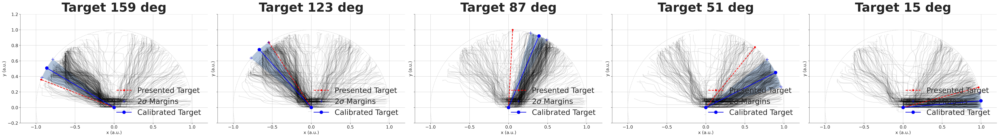

In [11]:
vx = x.reshape(12, 4*6*120, 1000)
vy = y.reshape(12, 4*6*120, 1000)
vid = r_table["f_resp"].values.reshape(12, 4*6*120)
vt = r_table["target"].values.reshape(12, 4*6*120)

plot_responses(9, vx, vy, vid, vt, med, std)

## Acc figures

### Acc bar

In [12]:
r_table.head().round(2)

,subj,sess,run,trial,target,t_calib,resp,resp_err,v_err,exp,nn,1sig,2sig,nn_c,att,coh,exp_al,f_onset,f_resp,dir
0,0,0,0,0,159.0,145.88,150.88,5.00,5.00,145.88,145.88,1.0,1.0,1.0,-1,1,1.0,132,373,higher
1,0,0,0,1,123.0,138.72,127.92,10.80,-10.80,145.88,138.72,1.0,1.0,1.0,1,1,0.0,204,280,lower
2,0,0,0,2,51.0,32.87,131.00,98.13,98.13,145.88,138.72,0.0,0.0,0.0,1,1,0.0,168,250,higher
3,0,0,0,3,159.0,145.88,144.78,1.10,-1.10,145.88,145.88,1.0,1.0,1.0,-1,1,1.0,168,337,lower
4,0,0,0,4,15.0,18.75,142.79,124.04,124.04,145.88,145.88,0.0,0.0,0.0,-1,-1,0.0,180,270,higher


In [13]:
# Calculating accuracy for each condition

accuracy_data = {

    "Condition": ["Low Coherence", "High Coherence", "Divided Attention", "Focused Attention", "Unexpected", "Expected"],

    "Accuracy": [
        r_table.loc[r_table["coh"] == -1, "2sig"].mean(skipna = True),
        r_table.loc[r_table["coh"] == 1, "2sig"].mean(skipna = True),
        r_table.loc[r_table["att"] == -1, "2sig"].mean(skipna = True),
        r_table.loc[r_table["att"] == 1, "2sig"].mean(skipna = True),
        r_table.loc[r_table["exp_al"] == 0, "2sig"].mean(skipna = True),
        r_table.loc[r_table["exp_al"] == 1, "2sig"].mean(skipna = True),
    ],

    "Color": ["gray", "darkgray", "blue", "darkblue", "red", "darkred"],

}

/tmp/ipykernel_15223/1884693839.py:16: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


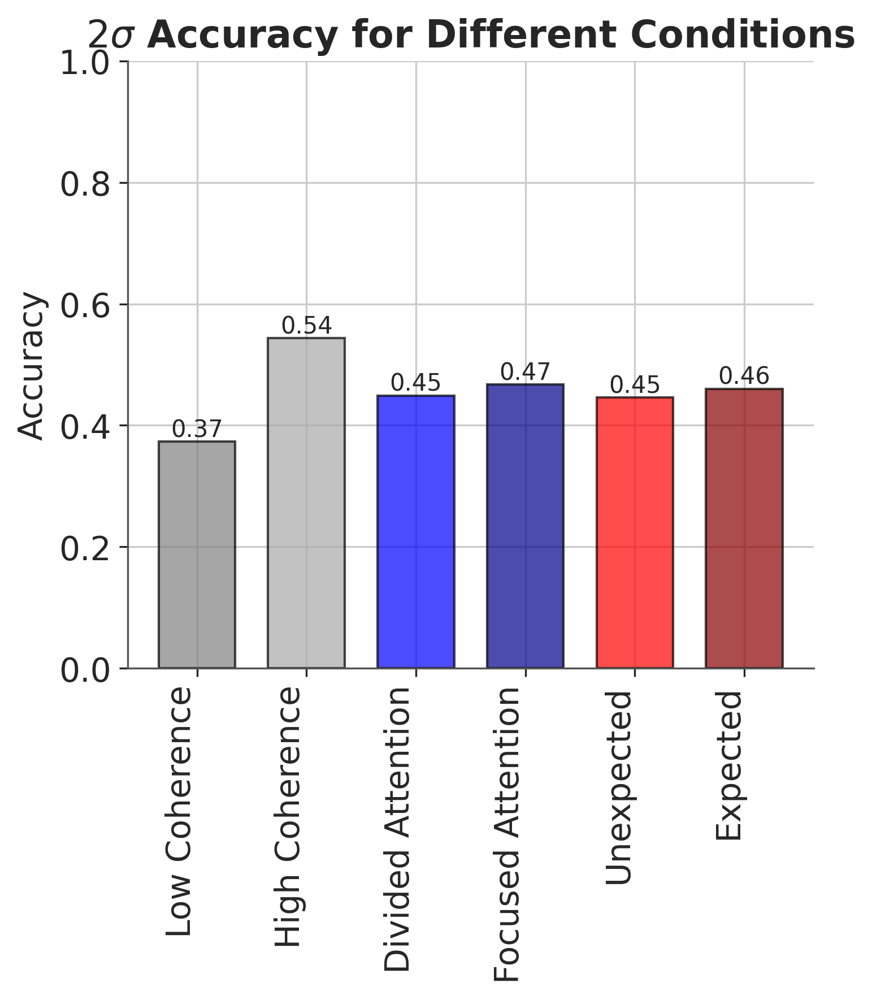

In [14]:
# Plotting the bar chart
accuracy_df = pd.DataFrame(accuracy_data)
fig, ax = plt.subplots(figsize=(5, 6), dpi=300)
bars = ax.bar(accuracy_df["Condition"], accuracy_df["Accuracy"], color=accuracy_df["Color"], alpha=0.7, width=0.7, edgecolor="black")

# Adding labels to the bars
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), ha='center', va='bottom')

# Adding labels and title
ax.set_ylabel("Accuracy")
ax.set_title("$2\sigma$ Accuracy for Different Conditions")
ax.set_ylim(0, 1)
plt.xticks(rotation=90, ha="right")
plt.tight_layout()

# Display the chart
plt.show()

### Acc violin

In [15]:
dt = np.array([
    r_table[r_table["coh"] == -1].groupby("subj")["2sig"].mean().values,
    r_table[r_table["coh"] == 1].groupby("subj")["2sig"].mean().values,
    r_table[r_table["att"] == -1].groupby("subj")["2sig"].mean().values,
    r_table[r_table["att"] == 1].groupby("subj")["2sig"].mean().values,
    r_table[r_table["exp_al"] == 0].groupby("subj")["2sig"].mean().values,
    r_table[r_table["exp_al"] == 1].groupby("subj")["2sig"].mean().values,
])

In [17]:
vdf = pd.DataFrame({
    "acc": dt.flatten(),
    "cond": np.array(accuracy_data["Condition"]).repeat(12),
    "subj": np.tile(np.arange(0,12), 6),
    "Color": np.array(accuracy_data["Color"]).repeat(12),
})

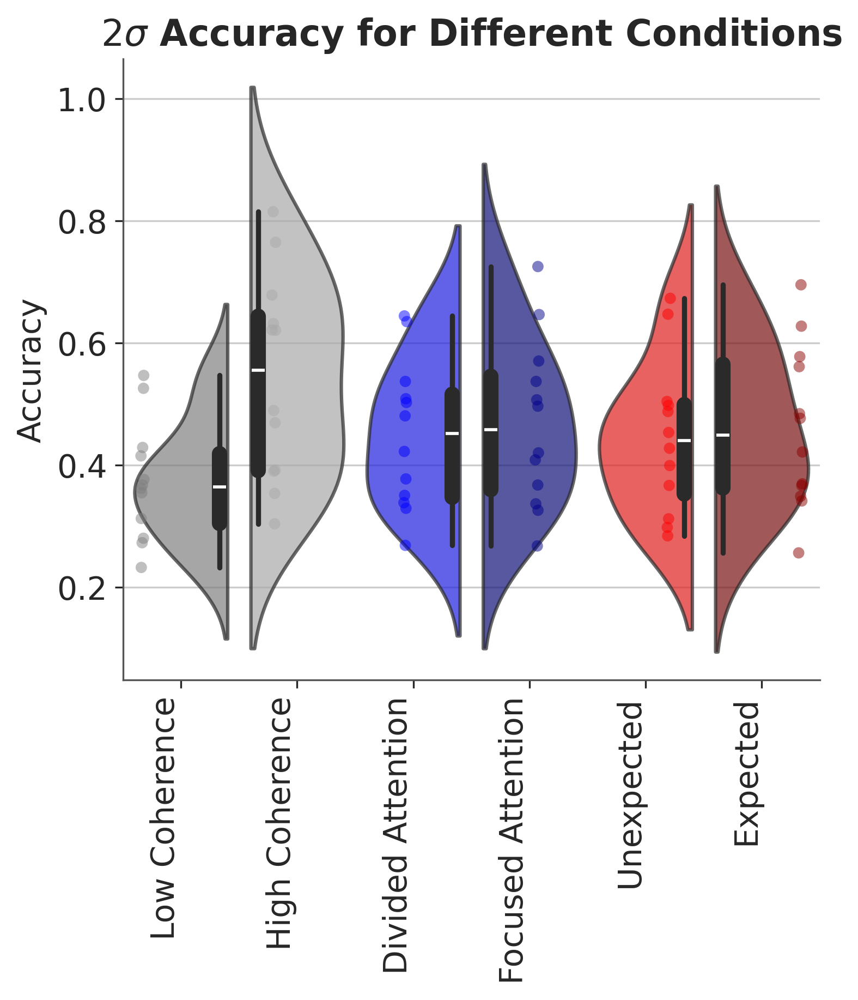

In [18]:
fig, ax = plt.subplots(figsize=(5, 6), dpi=300)
sns.violinplot(
    ax=ax,
    data=vdf, 
    x="cond", 
    y="acc", 
    hue="cond", 
    palette=vdf["Color"].unique().tolist(), 
    split=True, 
    inner="box", 
    linewidth=1.5, 
    alpha=0.7,
    native_scale=True,
)

# also plot the individual data points
sns.stripplot(
    ax=ax,
    data=vdf, 
    x="cond", 
    y="acc", 
    hue="cond", 
    palette=vdf["Color"].unique().tolist(), 
    dodge=True, 
    alpha=0.5,
)

plt.title("$2\sigma$ Accuracy for Different Conditions")
plt.ylabel("Accuracy")
plt.xticks(rotation=90, ha="right")
plt.xlabel("")
plt.show()


## Reaction times

In [19]:
tt = r_table.copy()
tt["f_time"] = (tt["f_resp"].astype(float) - 250) * (1000/120)
rt = np.array([
    tt[tt["coh"] == -1].groupby("subj")["f_time"].mean().values,
    tt[tt["coh"] == 1].groupby("subj")["f_time"].mean().values,
    tt[tt["att"] == -1].groupby("subj")["f_time"].mean().values,
    tt[tt["att"] == 1].groupby("subj")["f_time"].mean().values,
    tt[tt["exp_al"] == 0].groupby("subj")["f_time"].mean().values,
    tt[tt["exp_al"] == 1].groupby("subj")["f_time"].mean().values,
])

In [20]:
rdf = pd.DataFrame({
    "acc": rt.flatten(),
    "cond": np.array(accuracy_data["Condition"]).repeat(12),
    "subj": np.tile(np.arange(0,12), 6),
    "Color": np.array(accuracy_data["Color"]).repeat(12),
})

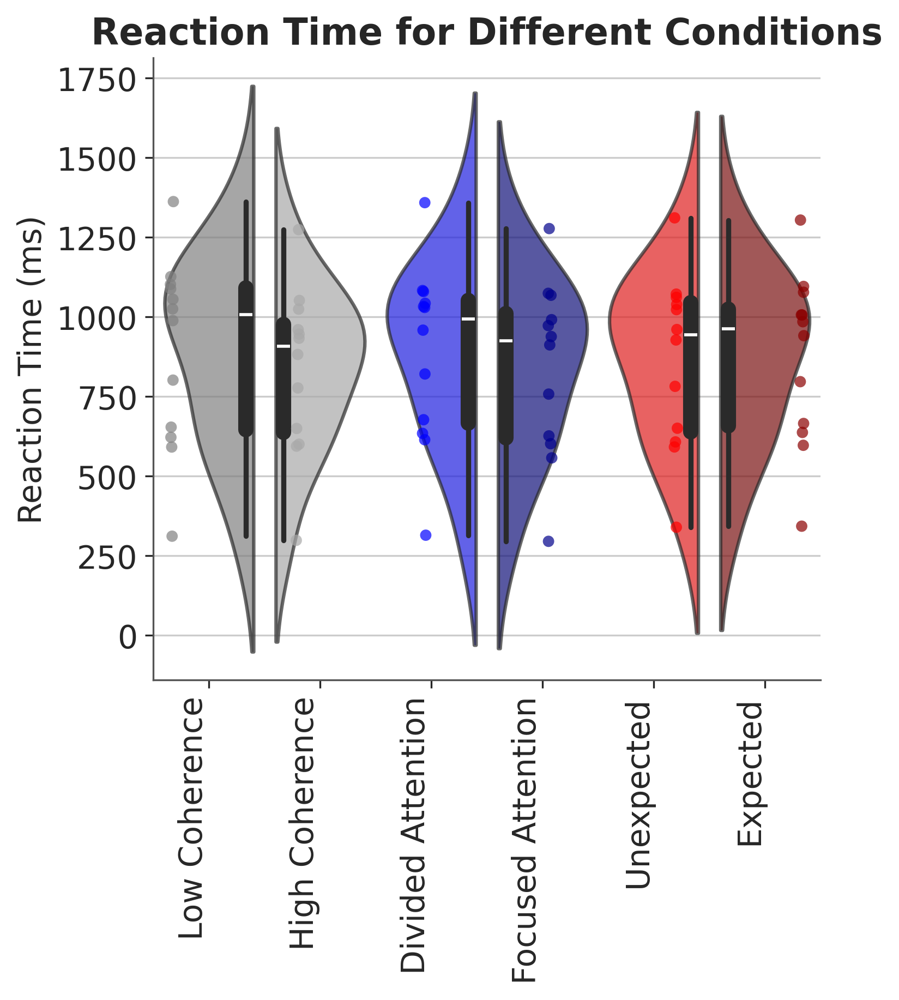

In [21]:

fig, ax = plt.subplots(figsize=(5, 6), dpi=300)
sns.violinplot(
    ax=ax,
    data=rdf, 
    x="cond", 
    y="acc", 
    hue="cond", 
    palette=rdf["Color"].unique().tolist(), 
    split=True, 
    inner="box",
    linewidth=1.5, 
    alpha=0.7,
    native_scale=True,
)

# also show the dots on the violin plot
sns.stripplot(
    ax=ax,
    x="cond",
    y="acc",
    data=rdf,
    hue="cond",
    palette=rdf["Color"].unique().tolist(),
    dodge=True,
    alpha=0.7,
    edgecolor="black",
)

plt.title("Reaction Time for Different Conditions")
plt.ylabel("Reaction Time (ms)")
plt.xticks(rotation=90, ha="right")
plt.xlabel("")
plt.show()


## Timepoint figures

In [22]:
labels = ["Low Coherence", "High Coherence", "Divided Attention", "Focused Attention", "Unexpected", "Expected"]
colors = ["gray", "darkgray", "blue", "darkblue", "red", "darkred"]
linestyles = ["--", "-", "--", "-", "--", "-"]

xaxis = np.array(range(-250, 750, 1))*(1000/120)

### Distance Plots

In [23]:
# Masks
low_coherence_mask = r_table["coh"] == -1
high_coherence_mask = r_table["coh"] == 1

divided_attention_mask = r_table["att"] == -1
focused_attention_mask = r_table["att"] == 1

unexpected_mask = r_table["exp_al"] == 0
expected_mask = r_table["exp_al"] == 1

In [24]:
d_low = d.reshape(-1, 1000)[low_coherence_mask].mean(axis=0)
d_high = d.reshape(-1, 1000)[high_coherence_mask].mean(axis=0)

d_divided = d.reshape(-1, 1000)[divided_attention_mask].mean(axis=0)
d_focused = d.reshape(-1, 1000)[focused_attention_mask].mean(axis=0)

d_unexpected = d.reshape(-1, 1000)[unexpected_mask].mean(axis=0)
d_expected = d.reshape(-1, 1000)[expected_mask].mean(axis=0)

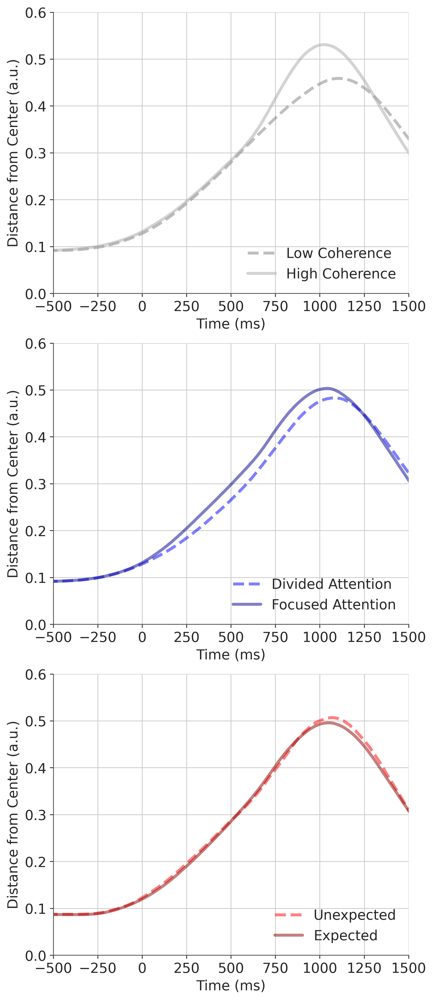

In [25]:
# Plotting the data
fig, ax = plt.subplots(3,1, figsize=(6, 14), dpi=300)

vals = [d_low, d_high, d_divided, d_focused, d_unexpected, d_expected]

for i in range(6):
    ax[i//2].plot(xaxis, vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5, linewidth=3)
    ax[i//2].set_xlim(-500, 1500)
    ax[i//2].set_ylim(0, 0.6)
    ax[i//2].legend( loc='lower right', frameon=False)
    ax[i//2].set_xlabel("Time (ms)")
    ax[i//2].set_ylabel("Distance from Center (a.u.)")

# Adding labels and title
plt.show()


### Cumulative Distance Plots

In [26]:
# Create a mask to identify NaN values in x or y
nan_mask = np.isnan(x) | np.isnan(y)

# Replace NaN with 0 for distance calculation
x_no_nan = np.nan_to_num(x)
y_no_nan = np.nan_to_num(y)

# Calculate the Euclidean distance between consecutive points
distances = np.sqrt(
    np.diff(x_no_nan, axis=-1)**2 + np.diff(y_no_nan, axis=-1)**2
)

# Insert a leading zero for the first timestep to align with cumulative sum
distances = np.concatenate(
    [np.zeros((*distances.shape[:-1], 1)), distances], axis=-1
)

# Compute the cumulative sum
cumulative_distance = np.cumsum(distances, axis=-1)

# Reapply the NaN mask: any timestep with NaN in x or y will be NaN in the output
cumulative_distance[nan_mask] = np.nan

# cumulative_distance now preserves NaN where x or y was NaN


In [27]:
cd_low = cumulative_distance.reshape(-1, 1000)[low_coherence_mask].mean(axis=0)
cd_high = cumulative_distance.reshape(-1, 1000)[high_coherence_mask].mean(axis=0)

cd_divided = cumulative_distance.reshape(-1, 1000)[divided_attention_mask].mean(axis=0)
cd_focused = cumulative_distance.reshape(-1, 1000)[focused_attention_mask].mean(axis=0)

cd_unexpected = cumulative_distance.reshape(-1, 1000)[unexpected_mask].mean(axis=0)
cd_expected = cumulative_distance.reshape(-1, 1000)[expected_mask].mean(axis=0)

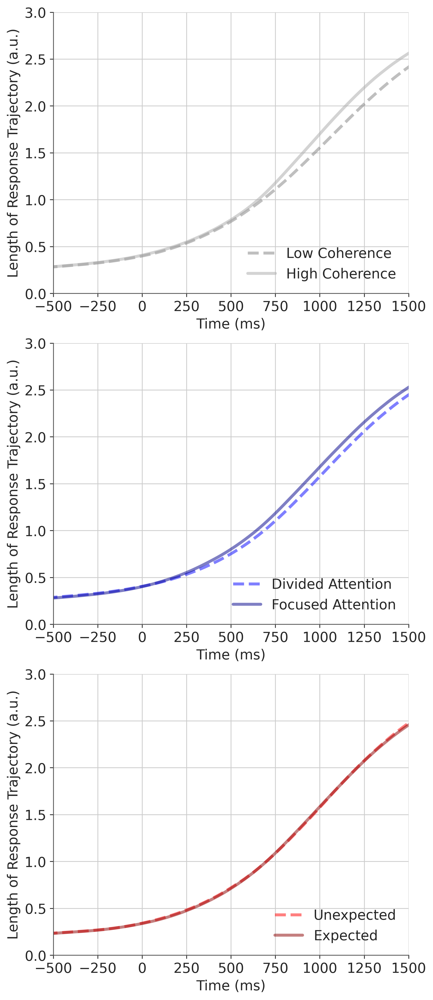

In [28]:
labels = ["Low Coherence", "High Coherence", "Divided Attention", "Focused Attention", "Unexpected", "Expected"]
colors = ["gray", "darkgray", "blue", "darkblue", "red", "darkred"]
linestyles = ["--", "-", "--", "-", "--", "-"]

xaxis = np.array(range(-250, 750, 1))*(1000/120)

# Plotting the data
fig, ax = plt.subplots(3,1, figsize=(6, 14), dpi=300)

vals = [cd_low, cd_high, cd_divided, cd_focused, cd_unexpected, cd_expected]

for i in range(6):
    ax[i//2].plot(xaxis, vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5, linewidth=3)
    ax[i//2].set_xlim(-500, 1500)
    ax[i//2].set_ylim(0, 3)
    ax[i//2].legend( loc='lower right', frameon=False)
    ax[i//2].set_xlabel("Time (ms)")
    ax[i//2].set_ylabel("Length of Response Trajectory (a.u.)")

# Adding labels and title
plt.show()


### Velocity Plots

In [29]:
# Velocity data is the speed of d
v = np.abs(np.diff(d))

v_low = v.reshape(-1, 999)[low_coherence_mask].mean(axis=0)
v_high = v.reshape(-1, 999)[high_coherence_mask].mean(axis=0)

v_divided = v.reshape(-1, 999)[divided_attention_mask].mean(axis=0)
v_focused = v.reshape(-1, 999)[focused_attention_mask].mean(axis=0)

v_unexpected = v.reshape(-1, 999)[unexpected_mask].mean(axis=0)
v_expected = v.reshape(-1, 999)[expected_mask].mean(axis=0)

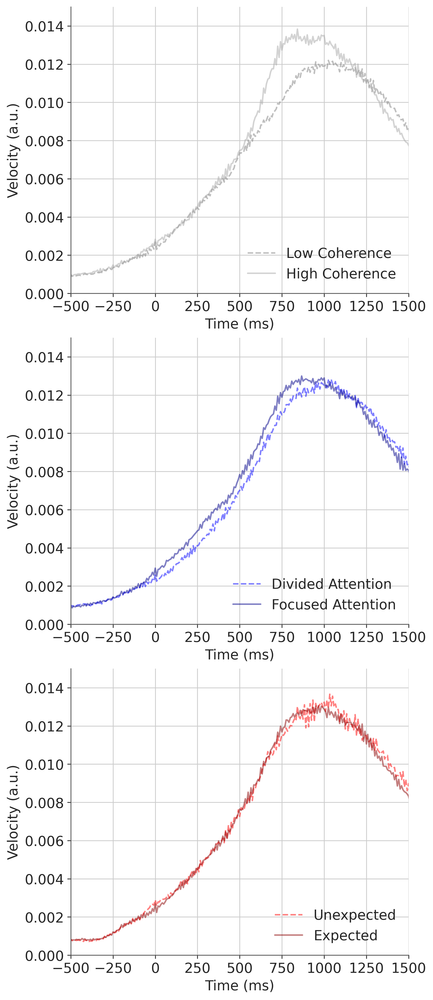

In [30]:
# Plotting the data
fig, ax = plt.subplots(3,1, figsize=(6, 14), dpi=300)

vals = [v_low, v_high, v_divided, v_focused, v_unexpected, v_expected]

for i in range(6):
    ax[i//2].plot(xaxis[1:], vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5)
    ax[i//2].set_xlim(-500, 1500)
    ax[i//2].set_ylim(0, 0.015)
    ax[i//2].legend( loc='lower right', frameon=False)
    ax[i//2].set_xlabel("Time (ms)")
    ax[i//2].set_ylabel("Velocity (a.u.)")

# Adding labels and title
plt.show()

### Acceleration Plots

In [31]:
a = np.abs(np.diff(v))

a_low = a.reshape(-1, 998)[low_coherence_mask].mean(axis=0)
a_high = a.reshape(-1, 998)[high_coherence_mask].mean(axis=0)

a_divided = a.reshape(-1, 998)[divided_attention_mask].mean(axis=0)
a_focused = a.reshape(-1, 998)[focused_attention_mask].mean(axis=0)

a_unexpected = a.reshape(-1, 998)[unexpected_mask].mean(axis=0)
a_expected = a.reshape(-1, 998)[expected_mask].mean(axis=0)

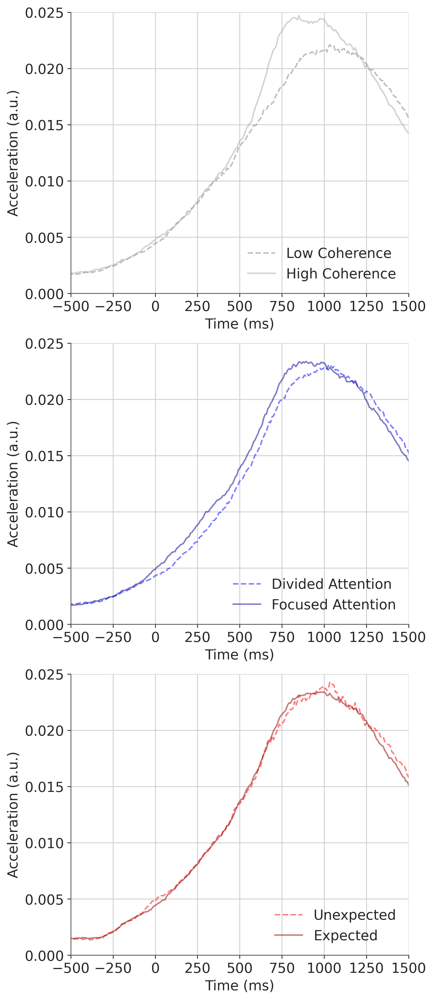

In [32]:
# Plotting the data

fig, ax = plt.subplots(3,1, figsize=(6, 14), dpi=300)

vals = [a_low, a_high, a_divided, a_focused, a_unexpected, a_expected]

for i in range(6):
    ax[i//2].plot(xaxis[2:], vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5)
    ax[i//2].set_xlim(-500, 1500)
    ax[i//2].set_ylim(0, 0.025)
    ax[i//2].legend( loc='lower right', frameon=False)
    ax[i//2].set_xlabel("Time (ms)")
    ax[i//2].set_ylabel("Acceleration (a.u.)")

### Global Error Traces

In [33]:
e_low = np.nanmean(e.reshape(-1, 1000)[low_coherence_mask], axis=0)
e_high = np.nanmean(e.reshape(-1, 1000)[high_coherence_mask], axis=0)

e_divided = np.nanmean(e.reshape(-1, 1000)[divided_attention_mask], axis=0)
e_focused = np.nanmean(e.reshape(-1, 1000)[focused_attention_mask], axis=0)

e_unexpected = np.nanmean(e.reshape(-1, 1000)[unexpected_mask], axis=0)
e_expected = np.nanmean(e.reshape(-1, 1000)[expected_mask], axis=0)

/tmp/ipykernel_15223/3684809487.py:1: RuntimeWarning: Mean of empty slice
  e_low = np.nanmean(e.reshape(-1, 1000)[low_coherence_mask], axis=0)
/tmp/ipykernel_15223/3684809487.py:2: RuntimeWarning: Mean of empty slice
  e_high = np.nanmean(e.reshape(-1, 1000)[high_coherence_mask], axis=0)
/tmp/ipykernel_15223/3684809487.py:4: RuntimeWarning: Mean of empty slice
  e_divided = np.nanmean(e.reshape(-1, 1000)[divided_attention_mask], axis=0)
/tmp/ipykernel_15223/3684809487.py:5: RuntimeWarning: Mean of empty slice
  e_focused = np.nanmean(e.reshape(-1, 1000)[focused_attention_mask], axis=0)
/tmp/ipykernel_15223/3684809487.py:7: RuntimeWarning: Mean of empty slice
  e_unexpected = np.nanmean(e.reshape(-1, 1000)[unexpected_mask], axis=0)
/tmp/ipykernel_15223/3684809487.py:8: RuntimeWarning: Mean of empty slice
  e_expected = np.nanmean(e.reshape(-1, 1000)[expected_mask], axis=0)


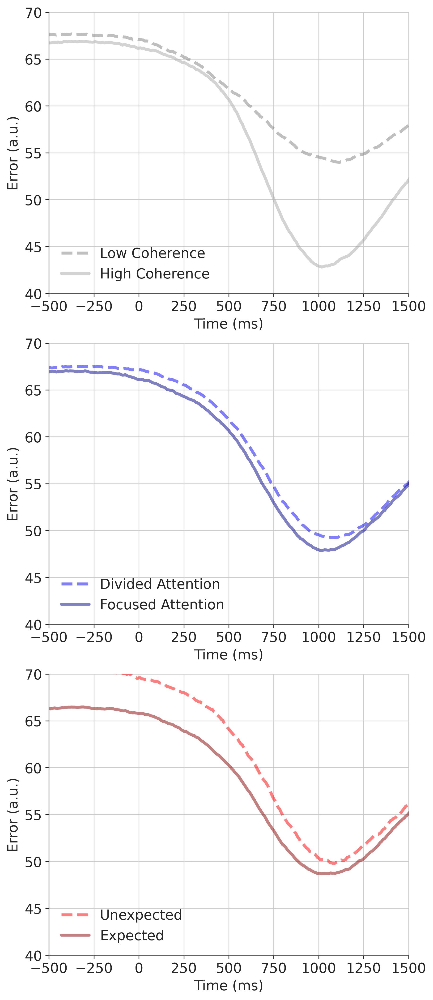

In [34]:
# Plotting the data
fig, ax = plt.subplots(3,1, figsize=(6, 14), dpi=300)

vals = [e_low, e_high, e_divided, e_focused, e_unexpected, e_expected]

for i in range(6):
    ax[i//2].plot(xaxis, vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5, linewidth=3)
    ax[i//2].set_xlim(-500, 1500)
    ax[i//2].set_ylim(40, 70)
    ax[i//2].legend( loc='lower left', frameon=False)
    ax[i//2].set_xlabel("Time (ms)")
    ax[i//2].set_ylabel("Error (a.u.)")

## Subject specific Traces

In [114]:
labels = ["Low Coherence", "High Coherence", "Divided Attention", "Focused Attention", "Unexpected", "Expected"]
colors = ["gray", "darkgray", "blue", "darkblue", "red", "darkred"]
linestyles = ["--", "-", "--", "-", "--", "-"]

xaxis = np.array(range(-250, 750, 1))*(1000/120)

### Subject Specific Error Traces

In [115]:
def plot_err(vals, labels, colors, linestyles, ax, title):
    for i in range(6):
        ax[i//2].plot(xaxis, vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5, linewidth=3)
        ax[i//2].set_xlim(-500, 1500)
        ax[i//2].set_ylim(0, 150)
        ax[i//2].legend( loc='lower left', frameon=False)
        ax[i//2].set_xlabel("Time (ms)")
        ax[i//2].set_ylabel("Error (deg)")

    # Adding labels and title
    ax[0].set_title(title)

n_subjects = 12

fig, ax = plt.subplots(3,1 * n_subjects, figsize=(6 * n_subjects, 14), dpi=300)

for s in range(n_subjects):
    # current subject specific tasks
    # Masks
    low_coherence_mask = (r_table["coh"] == -1) & (r_table["subj"] == s)
    high_coherence_mask = (r_table["coh"] == 1) & (r_table["subj"] == s)

    divided_attention_mask = (r_table["att"] == -1) & (r_table["subj"] == s)
    focused_attention_mask = (r_table["att"] == 1) & (r_table["subj"] == s)

    unexpected_mask = (r_table["exp_al"] == 0) & (r_table["subj"] == s)
    expected_mask = (r_table["exp_al"] == 1) & (r_table["subj"] == s)

    e_low = np.nanmean(e.reshape(-1, 1000)[low_coherence_mask], axis=0)
    e_high = np.nanmean(e.reshape(-1, 1000)[high_coherence_mask], axis=0)

    e_divided = np.nanmean(e.reshape(-1, 1000)[divided_attention_mask], axis=0)
    e_focused = np.nanmean(e.reshape(-1, 1000)[focused_attention_mask], axis=0)

    e_unexpected = np.nanmean(e.reshape(-1, 1000)[unexpected_mask], axis=0)
    e_expected = np.nanmean(e.reshape(-1, 1000)[expected_mask], axis=0)

    vals = [e_low, e_high, e_divided, e_focused, e_unexpected, e_expected]

    current_column_of_axs = ax[:, s]
    plot_err(vals, labels, colors, linestyles, current_column_of_axs, title = f"Subject {s+1}")

# plt.show()
plt.suptitle("Error for Different Conditions for Each Subject")
plt.savefig("error_plots.jpg")

/tmp/ipykernel_321579/822870666.py:29: RuntimeWarning: Mean of empty slice
  e_low = np.nanmean(e.reshape(-1, 1000)[low_coherence_mask], axis=0)
/tmp/ipykernel_321579/822870666.py:30: RuntimeWarning: Mean of empty slice
  e_high = np.nanmean(e.reshape(-1, 1000)[high_coherence_mask], axis=0)
/tmp/ipykernel_321579/822870666.py:32: RuntimeWarning: Mean of empty slice
  e_divided = np.nanmean(e.reshape(-1, 1000)[divided_attention_mask], axis=0)
/tmp/ipykernel_321579/822870666.py:33: RuntimeWarning: Mean of empty slice
  e_focused = np.nanmean(e.reshape(-1, 1000)[focused_attention_mask], axis=0)
/tmp/ipykernel_321579/822870666.py:35: RuntimeWarning: Mean of empty slice
  e_unexpected = np.nanmean(e.reshape(-1, 1000)[unexpected_mask], axis=0)
/tmp/ipykernel_321579/822870666.py:36: RuntimeWarning: Mean of empty slice
  e_expected = np.nanmean(e.reshape(-1, 1000)[expected_mask], axis=0)


### Subject Specific Distance Traces

In [38]:
def plot_err(vals, ax, title):
    for i in range(6):
        ax[i//2].plot(xaxis, vals[i], linestyle=linestyles[i], label=labels[i], color=colors[i], alpha=0.5, linewidth=3)
        ax[i//2].set_xlim(-500, 1500)
        ax[i//2].set_ylim(0, .8)
        ax[i//2].legend( loc='lower right', frameon=False)
        ax[i//2].set_xlabel("Time (ms)")
        ax[i//2].set_ylabel("Distance from Center (a.u.)")

    # Adding labels and title
    ax[0].set_title(title)

n_subjects = 12

fig, ax = plt.subplots(3,1 * n_subjects, figsize=(6 * n_subjects, 14), dpi=300)

for s in range(n_subjects):
    # current subject specific tasks
    # Masks
    low_coherence_mask = (r_table["coh"] == -1) & (r_table["subj"] == s)
    high_coherence_mask = (r_table["coh"] == 1) & (r_table["subj"] == s)

    divided_attention_mask = (r_table["att"] == -1) & (r_table["subj"] == s)
    focused_attention_mask = (r_table["att"] == 1) & (r_table["subj"] == s)

    unexpected_mask = (r_table["exp_al"] == 0) & (r_table["subj"] == s)
    expected_mask = (r_table["exp_al"] == 1) & (r_table["subj"] == s)

    e_low = np.nanmean(d.reshape(-1, 1000)[low_coherence_mask], axis=0)
    e_high = np.nanmean(d.reshape(-1, 1000)[high_coherence_mask], axis=0)

    e_divided = np.nanmean(d.reshape(-1, 1000)[divided_attention_mask], axis=0)
    e_focused = np.nanmean(d.reshape(-1, 1000)[focused_attention_mask], axis=0)

    e_unexpected = np.nanmean(d.reshape(-1, 1000)[unexpected_mask], axis=0)
    e_expected = np.nanmean(d.reshape(-1, 1000)[expected_mask], axis=0)

    vals = [e_low, e_high, e_divided, e_focused, e_unexpected, e_expected]

    current_column_of_axs = ax[:, s]
    plot_err(vals, current_column_of_axs, title=f"Subject {s+1}")

# plt.show()
plt.suptitle("Distance from Center for Different Conditions")
plt.savefig("distance_plots.jpg")

### Subject Specific traces conditioned on stim dir

/tmp/ipykernel_321579/1294451376.py:25: RuntimeWarning: Mean of empty slice
  e_data = np.nanmean(e.reshape(-1, 1000)[mask], axis=0)


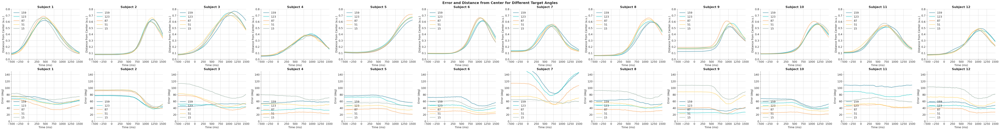

In [133]:
# rather than the conditions, lets now condition using the target angles
n_subjects = 12

fig, ax = plt.subplots(2,n_subjects, figsize=(6 * n_subjects, 9.33), dpi=100)

for cond in experiment_orientations:
    for s in range(n_subjects):

        # subject data and correct condtions
        mask = (r_table["target"] == cond) & (r_table["subj"] == s)

        d_data = np.nanmean(d.reshape(-1, 1000)[mask], axis=0)

        a = ax[0, s]

        a.plot(xaxis, d_data, label=f"{cond}", alpha=0.5, linewidth=3)

        a.set_xlim(-500, 1500)
        a.set_ylim(0, .8)
        a.legend( loc='upper left', frameon=False)
        a.set_xlabel("Time (ms)")
        a.set_ylabel("Distance from Center (a.u.)")
        a.set_title(f"Subject {s+1}")

        e_data = np.nanmean(e.reshape(-1, 1000)[mask], axis=0)

        a = ax[1, s]

        a.plot(xaxis, e_data, label=f"{cond}", alpha=0.5, linewidth=3)

        a.set_xlim(-500, 1500)
        a.set_ylim(0, 150)
        a.legend( loc='lower left', frameon=False)
        a.set_xlabel("Time (ms)")
        a.set_ylabel("Error (deg)")
        a.set_title(f"Subject {s+1}")

plt.suptitle("Error and Distance from Center for Different Target Angles")
plt.show()


In [116]:


# (r_table["target"] == ang) & (r_table["subj"] == s)

,subj,sess,run,trial,target,t_calib,resp,resp_err,v_err,exp,nn,1sig,2sig,nn_c,att,coh,exp_al,f_onset,f_resp,dir
0,0,0,0,0,159.0,145.877462,150.877772,5.000310,5.000310,145.877462,145.877462,1.0,1.0,1.0,-1,1,1.0,132,373,higher
1,0,0,0,1,123.0,138.718044,127.920427,10.797617,-10.797617,145.877462,138.718044,1.0,1.0,1.0,1,1,0.0,204,280,lower
2,0,0,0,2,51.0,32.872185,131.003103,98.130917,98.130917,145.877462,138.718044,0.0,0.0,0.0,1,1,0.0,168,250,higher
3,0,0,0,3,159.0,145.877462,144.775174,1.102288,-1.102288,145.877462,145.877462,1.0,1.0,1.0,-1,1,1.0,168,337,lower
4,0,0,0,4,15.0,18.752776,142.791565,124.038789,124.038789,145.877462,145.877462,0.0,0.0,0.0,-1,-1,0.0,180,270,higher
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34555,11,3,5,115,51.0,37.048176,160.967904,123.919728,123.919728,NaN,151.890213,0.0,0.0,0.0,1,1,NaN,168,292,higher
34556,11,3,5,116,15.0,2.591583,37.650337,35.058754,35.058754,NaN,37.048176,0.0,0.0,0.0,-1,1,NaN,156,364,higher
34557,11,3,5,117,159.0,151.890213,85.831991,66.058222,-66.058222,NaN,89.645622,0.0,0.0,0.0,1,-1,NaN,156,401,lower
34558,11,3,5,118,123.0,137.879638,154.102492,16.222854,16.222854,NaN,151.890213,0.0,1.0,0.0,-1,-1,NaN,156,384,higher


In [117]:
experiment_orientations

[159, 123, 87, 51, 15]

## Viz of Medians and SDs

### Medians

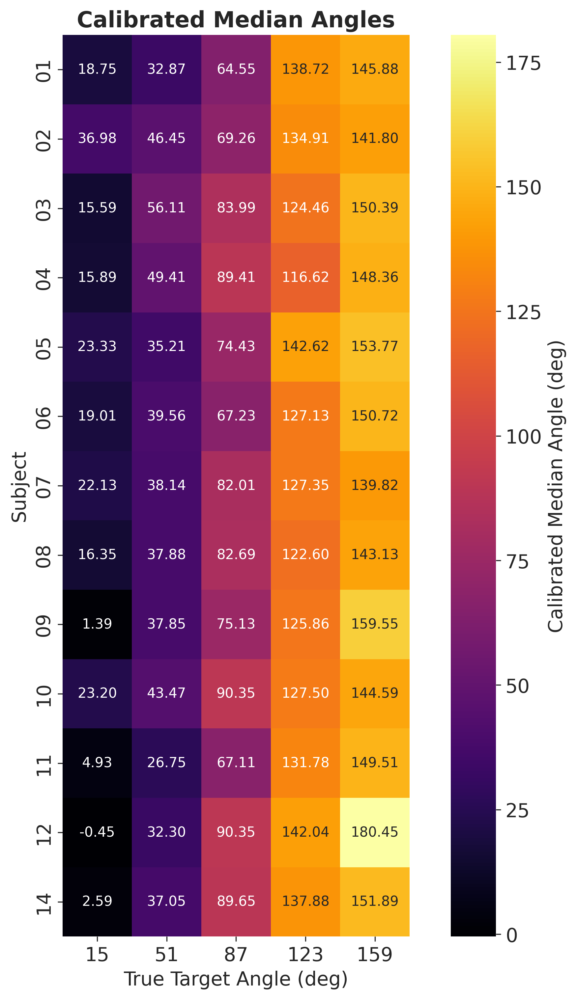

In [88]:
# True targets for medians = 15, 51, 87, 123, 159
# sns.heatmap(med, cmap="inferno", cbar_kws={'label': 'Calibrated Median Angle (deg)'})

# Plot sns heatmap for the median angles. make each box a square
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.heatmap(med, cmap="inferno", cbar_kws={'label': 'Calibrated Median Angle (deg)'}, square=True, ax=ax, annot=True, fmt=".2f")
xticks = [f"{i}" for i in [15, 51, 87, 123, 159]]
yticks = [f"{i}" for i in subjects]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
plt.xlabel("True Target Angle (deg)")
plt.ylabel("Subject")
plt.title("Calibrated Median Angles")
plt.show()

### Viz of SDs

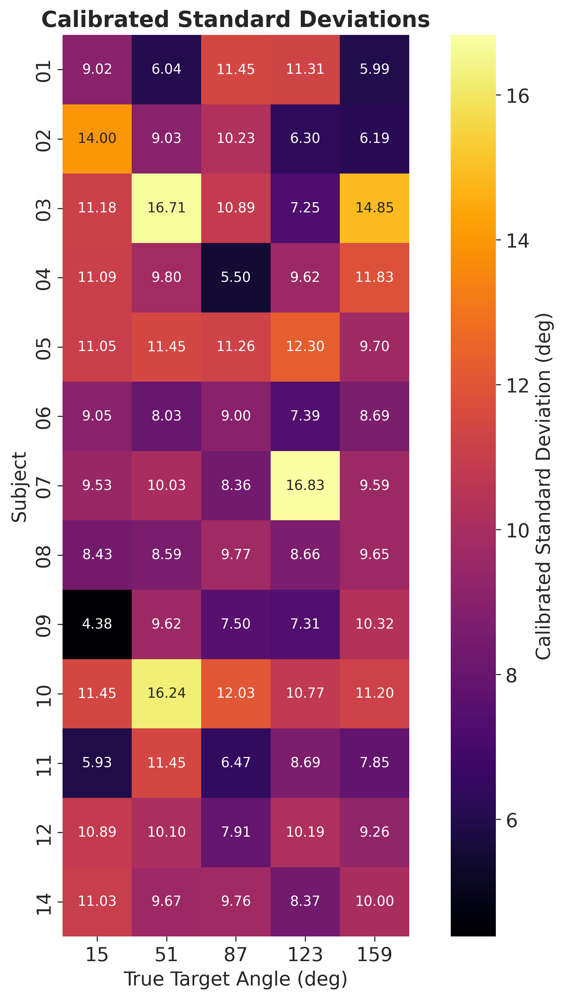

In [89]:
# Plot sns heatmap for the standard deviations. make each box a square
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.heatmap(std, cmap="inferno", cbar_kws={'label': 'Calibrated Standard Deviation (deg)'}, square=True, ax=ax, annot=True, fmt=".2f")
xticks = [f"{i}" for i in [15, 51, 87, 123, 159]]
yticks = [f"{i}" for i in subjects]
ax.set_xticklabels(xticks)
ax.set_yticklabels(yticks)
plt.xlabel("True Target Angle (deg)")
plt.ylabel("Subject")
plt.title("Calibrated Standard Deviations")
plt.show()